In [1]:
# Cell E — Generator (U-Net) (run this single cell)
import torch
import torch.nn as nn

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, norm=True):
        super().__init__()
        layers = [nn.Conv2d(in_ch, out_ch, kernel_size=4, stride=2, padding=1, bias=not norm)]
        if norm:
            layers.append(nn.BatchNorm2d(out_ch))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        self.block = nn.Sequential(*layers)
    def forward(self, x): return self.block(x)

class UpBlock(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=False):
        super().__init__()
        layers = [
            nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        ]
        if dropout:
            layers.append(nn.Dropout(0.5))
        self.block = nn.Sequential(*layers)
    def forward(self, x): return self.block(x)

class UNetGenerator(nn.Module):
    def __init__(self, in_ch=2, out_ch=2):
        super().__init__()
        # Encoder
        self.down1 = ConvBlock(in_ch, 64, norm=False)   # 256 -> 128
        self.down2 = ConvBlock(64, 128)                 # 128 -> 64
        self.down3 = ConvBlock(128, 256)                # 64 -> 32
        self.down4 = ConvBlock(256, 512)                # 32 -> 16
        self.down5 = ConvBlock(512, 512)                # 16 -> 8
        self.down6 = ConvBlock(512, 512)                # 8 -> 4
        self.down7 = ConvBlock(512, 512)                # 4 -> 2
        self.down8 = ConvBlock(512, 512, norm=False)    # 2 -> 1 (bottleneck)

        # Decoder
        self.up1 = UpBlock(512, 512, dropout=True)
        self.up2 = UpBlock(1024, 512, dropout=True)
        self.up3 = UpBlock(1024, 512, dropout=True)
        self.up4 = UpBlock(1024, 512)
        self.up5 = UpBlock(1024, 256)
        self.up6 = UpBlock(512, 128)
        self.up7 = UpBlock(256, 64)

        # final conv transpose -> out_ch (a,b) scaled with tanh
        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, out_ch, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)

        # Decoder with skip connections
        u1 = self.up1(d8)
        u2 = self.up2(torch.cat([u1, d7], dim=1))
        u3 = self.up3(torch.cat([u2, d6], dim=1))
        u4 = self.up4(torch.cat([u3, d5], dim=1))
        u5 = self.up5(torch.cat([u4, d4], dim=1))
        u6 = self.up6(torch.cat([u5, d3], dim=1))
        u7 = self.up7(torch.cat([u6, d2], dim=1))
        out = self.final(torch.cat([u7, d1], dim=1))
        return out



In [2]:
import torch

# ───────────────────────────────
# Step 3: Load Trained Generator
# ───────────────────────────────

# Path to your saved model (.pth)
MODEL_PATH = "fine_epoch_10.pth"

# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Device in use: {device}")

# Instantiate the Generator
G = UNetGenerator().to(device)

# Load weights
try:
    state_dict = torch.load(MODEL_PATH, map_location=device)
    # Sometimes model is saved as dict with key "G"
    if isinstance(state_dict, dict) and "G" in state_dict:
        state_dict = state_dict["G"]
    G.load_state_dict(state_dict)
    G.eval()
    print("✅ Model weights loaded successfully.")
except Exception as e:
    print("❌ Error loading model weights:", e)

# Verify model works with a dummy input
dummy_input = torch.randn(1, 2, 256, 256).to(device)
try:
    with torch.no_grad():
        output = G(dummy_input)
    print(f"✅ Forward pass OK — Output shape: {output.shape}")
except Exception as e:
    print("❌ Error during forward pass:", e)


✅ Device in use: cuda
✅ Model weights loaded successfully.
✅ Forward pass OK — Output shape: torch.Size([1, 2, 256, 256])


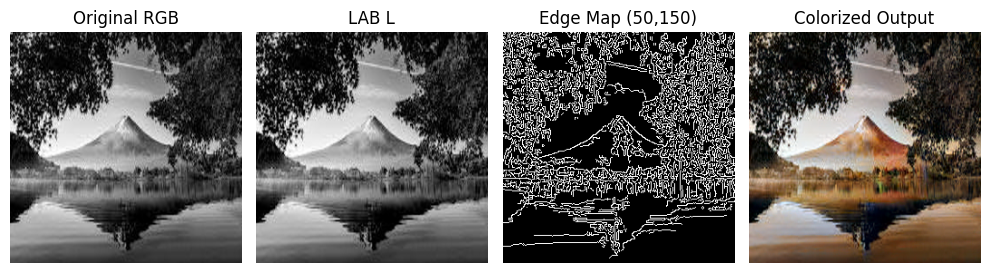

In [3]:
import cv2
import numpy as np
import torch
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt
from PIL import Image

# ───────────────────────────────
# Step 4.1 — Inference with Training-Consistent Edge Map
# ───────────────────────────────

image_path = "download.jpeg"  # any RGB test image
IMG_SIZE = (256, 256)
CANNY_THRESH1, CANNY_THRESH2 = 50, 150  # match training

# Load + resize image
img_rgb = np.array(Image.open(image_path).convert("RGB").resize(IMG_SIZE))

# Convert RGB → LAB, extract L channel
lab_img = rgb2lab(img_rgb).astype("float32")
L = lab_img[:, :, 0] / 100.0  # normalized L (0–1)

# Compute edge map from LAB L channel (training-consistent)
L_uint8 = (L * 255).astype("uint8")
edges = cv2.Canny(L_uint8, CANNY_THRESH1, CANNY_THRESH2)
edges = edges.astype(np.float32) / 255.0

# Combine channels [L, edges]
L_edge = torch.tensor(np.stack([L, edges], axis=0)).unsqueeze(0).to(device)

# Predict a,b channels
with torch.no_grad():
    ab_pred = G(L_edge).cpu().squeeze(0).numpy().transpose(1, 2, 0)

# Combine into LAB and convert back to RGB
L_lab = (L * 100).astype(np.float32)
ab_lab = (ab_pred * 255 - 128).astype(np.float32)
lab = np.concatenate([L_lab[..., None], ab_lab], axis=2)
rgb_out = (lab2rgb(lab) * 255).astype(np.uint8)

# Display
plt.figure(figsize=(10, 6))
plt.subplot(1, 4, 1); plt.imshow(img_rgb); plt.title("Original RGB"); plt.axis("off")
plt.subplot(1, 4, 2); plt.imshow(L, cmap="gray"); plt.title("LAB L"); plt.axis("off")
plt.subplot(1, 4, 3); plt.imshow(edges, cmap="gray"); plt.title("Edge Map (50,150)"); plt.axis("off")
plt.subplot(1, 4, 4); plt.imshow(rgb_out); plt.title("Colorized Output"); plt.axis("off")
plt.tight_layout(); plt.show()


In [4]:
import os, cv2, numpy as np, torch
from pathlib import Path
from skimage.color import rgb2lab, lab2rgb
from PIL import Image
from tqdm import tqdm

# ───────────────────────────────
# Step 5 — Batch Inference and Save Outputs
# ───────────────────────────────

input_dir  = Path("test_images")
output_dir = Path("results")
output_dir.mkdir(exist_ok=True)

IMG_SIZE = (256, 256)
CANNY_THRESH1, CANNY_THRESH2 = 50, 150

# Put model in eval mode
G.eval()

# Process each image
for img_path in tqdm(list(input_dir.glob("*.*")), desc="Colorizing"):
    try:
        img_rgb = np.array(Image.open(img_path).convert("RGB").resize(IMG_SIZE))
        
        # Convert to LAB → extract L channel
        lab_img = rgb2lab(img_rgb).astype("float32")
        L = lab_img[:, :, 0] / 100.0
        L_uint8 = (L * 255).astype("uint8")
        
        # Compute edge map (training-consistent)
        edges = cv2.Canny(L_uint8, CANNY_THRESH1, CANNY_THRESH2)
        edges = edges.astype(np.float32) / 255.0
        
        # Combine L and edge maps
        L_edge = torch.tensor(np.stack([L, edges], axis=0)).unsqueeze(0).to(device)
        
        # Predict a,b
        with torch.no_grad():
            ab_pred = G(L_edge).cpu().squeeze(0).numpy().transpose(1, 2, 0)
        
        # Convert LAB → RGB
        L_lab = (L * 100).astype(np.float32)
        ab_lab = (ab_pred * 255 - 128).astype(np.float32)
        lab = np.concatenate([L_lab[..., None], ab_lab], axis=2)
        rgb_out = (lab2rgb(lab) * 255).astype(np.uint8)
        
        # Save output
        save_path = output_dir / f"{img_path.stem}_colorized.png"
        Image.fromarray(rgb_out).save(save_path)
        
    except Exception as e:
        print(f"❌ Error processing {img_path.name}: {e}")

print(f"\n✅ All images processed. Results saved to: {output_dir.resolve()}")


Colorizing:  90%|█████████ | 9/10 [00:01<00:00,  7.79it/s]C:\Users\amans\AppData\Local\Temp\ipykernel_1332\1448193799.py:46: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb_out = (lab2rgb(lab) * 255).astype(np.uint8)
Colorizing: 100%|██████████| 10/10 [00:01<00:00,  7.06it/s]


✅ All images processed. Results saved to: C:\Users\amans\OneDrive\Desktop\Image_Colorization_Imd_Project\results


In [5]:
import cv2, numpy as np
from pathlib import Path
from PIL import Image

results_dir = Path("results")
sharpen_dir = Path("results_sharpened")
sharpen_dir.mkdir(exist_ok=True)

for img_path in results_dir.glob("*.png"):
    img = cv2.imread(str(img_path))
    # Light unsharp mask
    blur = cv2.GaussianBlur(img, (0,0), 1.0)
    sharp = cv2.addWeighted(img, 1.5, blur, -0.5, 0)
    cv2.imwrite(str(sharpen_dir / img_path.name), sharp)

print(f"✅ Sharpened results saved to {sharpen_dir.resolve()}")


✅ Sharpened results saved to C:\Users\amans\OneDrive\Desktop\Image_Colorization_Imd_Project\results_sharpened


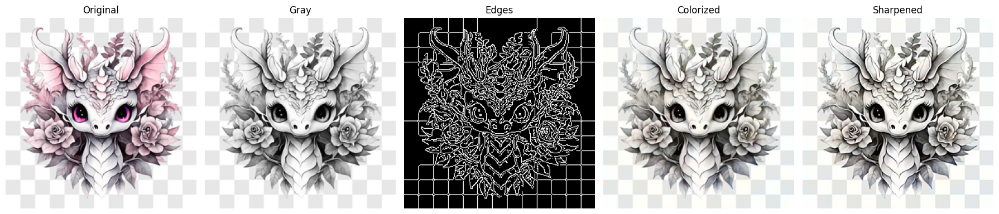

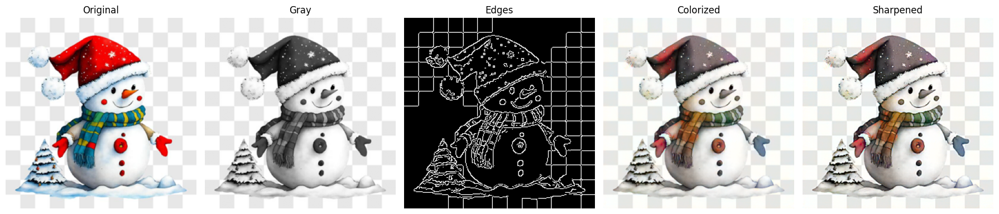

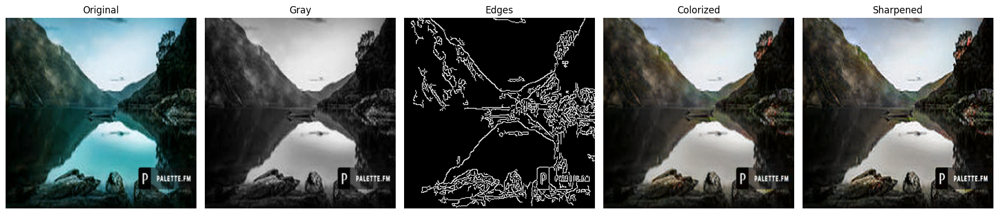

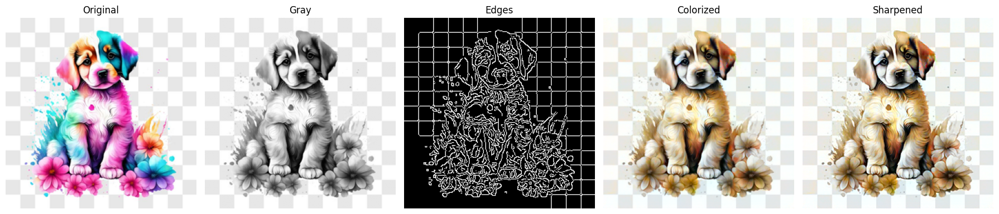

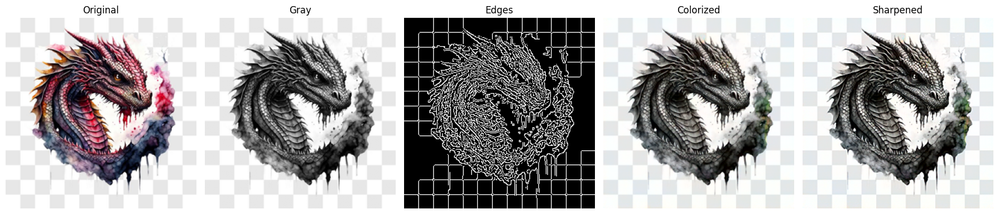

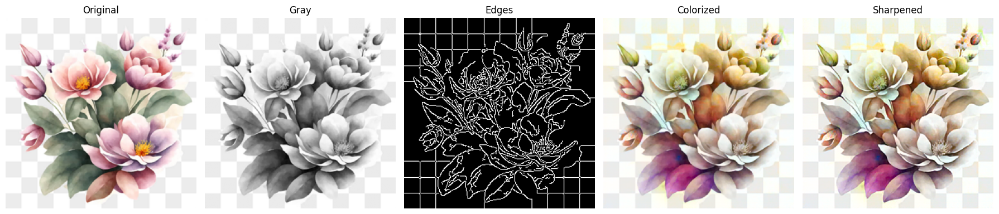

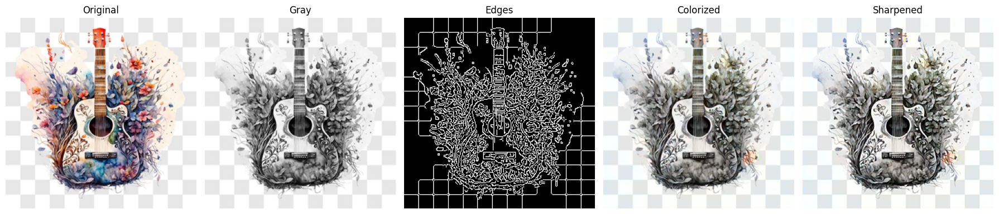

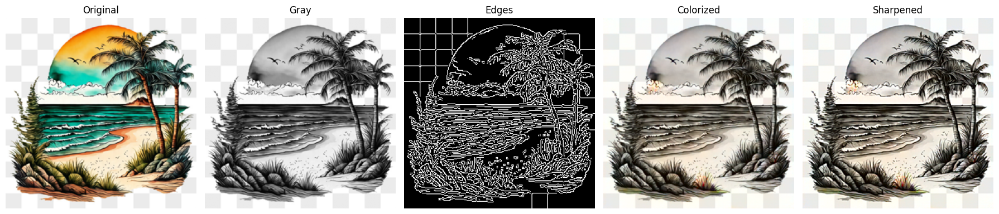

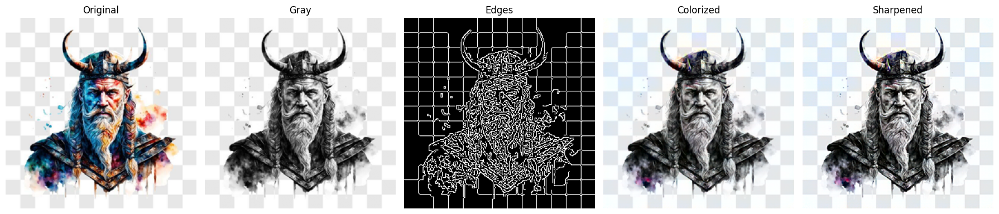

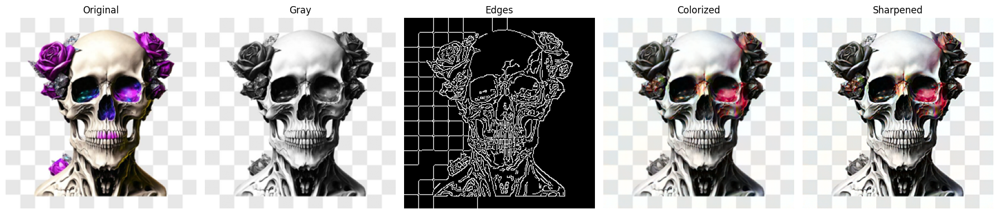

In [6]:
import matplotlib.pyplot as plt
from PIL import Image
import cv2

test_folder = Path("test_images")
colorized_folder = Path("results")
sharpened_folder = Path("results_sharpened")

for img_path in test_folder.glob("*.jpg"):
    name = img_path.stem
    orig = np.array(Image.open(img_path).resize((256,256)))
    gray = cv2.cvtColor(orig, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny((gray).astype("uint8"), 50, 150)
    colorized = np.array(Image.open(colorized_folder / f"{name}_colorized.png"))
    sharpened = np.array(Image.open(sharpened_folder / f"{name}_colorized.png"))

    fig, axs = plt.subplots(1,5, figsize=(18,4))
    titles = ["Original","Gray","Edges","Colorized","Sharpened"]
    imgs   = [orig, gray, edges, colorized, sharpened]

    for ax,img,title in zip(axs, imgs, titles):
        ax.imshow(img if img.ndim==3 else img, cmap="gray")
        ax.set_title(title)
        ax.axis("off")
    plt.tight_layout()
    plt.show()


In [7]:
traced = torch.jit.trace(G, torch.randn(1, 2, 256, 256).to(device))
traced.save("generator_traced.pt")
